<a href="https://colab.research.google.com/github/sankichi92/satelliteBook/blob/main/notebooks/4-1-band_calc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 4-1 バンド演算について

[『Pythonで学ぶ衛星データ解析基礎』](https://gihyo.jp/book/2022/978-4-297-13232-3)第4章 衛星データ解析手法別演習 [解析編] より。

In [1]:
!date --rfc-3339=seconds

2023-01-09 12:30:07+00:00


In [2]:
!python --version

Python 3.8.16


In [3]:
!pip install geopandas>=0.12.2 pystac-client>=0.5.1 rioxarray>=0.13.3

In [4]:
%config InlineBackend.figure_formats = ['retina']

In [5]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['figure.dpi'] = 100

関心領域の Sentinel 2 データを [Earth Search](https://www.element84.com/earth-search/) で検索する。

In [6]:
aoi_code = '46201' # 鹿児島市

In [7]:
import geopandas as gpd

aoi_gdf = gpd.read_file(f'https://shikuchoson-boundaries.sankichi.app/{aoi_code}.geojson')
aoi_gdf

,都道府県,市区町村,行政区域コード,geometry
0,鹿児島県,鹿児島市,46201,"MULTIPOLYGON (((130.58221 31.30801, 130.58202 ..."


In [8]:
from pystac_client import Client

client = Client.open('https://earth-search.aws.element84.com/v0')
res = client.search(
    collections='sentinel-s2-l2a-cogs',
    bbox=aoi_gdf.total_bounds,
    datetime='2022',
    query=['eo:cloud_cover<10', 'sentinel:valid_cloud_cover=true'],
)
res.matched()

20

もっとも被雲率が低い Item を取り出し、サムネイルを表示する。

In [9]:
item = min(res.items(), key=lambda item: item.properties['eo:cloud_cover'])
item

ID: S2A_52SFA_20221227_0_L2A
"Bounding Box: [130.05348663385217, 31.52768345382664, 131.23354181568442, 32.53283751655785]"
Datetime: 2022-12-27 02:08:35+00:00
datetime: 2022-12-27T02:08:35Z
platform: sentinel-2a
constellation: sentinel-2
instruments: ['msi']
gsd: 10
view:off_nadir: 0
proj:epsg: 32652
sentinel:utm_zone: 52


In [10]:
from IPython.display import Image
Image(url=item.assets['thumbnail'].href)

緑、青、赤、近赤外のバンドデータを [Xarray](https://docs.xarray.dev/) の DataArray として読み込み、関心領域のみを切り出す。

In [11]:
import rioxarray
import xarray as xr

band_names = ['B02', 'B03', 'B04', 'B08']
aoi_data = []
for band_name in band_names:
  band = rioxarray.open_rasterio(item.assets[band_name].href)
  band = band.rio.clip_box(*aoi_gdf.total_bounds, crs=aoi_gdf.crs)
  aoi_data.append(band)

aoi_data = xr.concat(aoi_data, dim='band').assign_coords(band=band_names)
aoi_data

<xarray.DataArray (band: 4, y: 2411, x: 3329)>
array([[[ 446, 1422, 1990, ...,  454,  598,  564],
        [ 247,  452, 1404, ...,  430,  606,  755],
        [ 264,  279,  866, ...,  352,  866, 1246],
        ...,
        [ 305,  286,  156, ...,   99,   67,  114],
        [ 200,  250,  185, ...,   50,   49,  206],
        [ 172,  236,  236, ...,   25,   52,  258]],

       [[ 462, 1454, 2078, ...,  556,  795,  858],
        [ 289,  503, 1528, ...,  610,  661,  778],
        [ 356,  430,  912, ...,  412,  904, 1456],
        ...,
        [ 456,  468,  373, ...,  299,  220,  303],
        [ 369,  357,  345, ...,  153,  200,  326],
        [ 443,  371,  346, ...,  120,  285,  464]],

       [[ 389, 1266, 1996, ...,  637, 1044, 1194],
        [ 221,  397, 1526, ...,  686,  772,  969],
        [ 288,  370,  832, ...,  558, 1050, 1532],
        ...,
        [ 360,  377,  208, ...,  231,  156,  287],
        [ 238,  257,  186, ...,  169,  149,  377],
        [ 222,  179,  195, ...,  150,  194,  464]],

       [[ 959, 1666, 2744, ..., 1090, 1506, 1682],
        [1716, 1476, 2460, ..., 1270, 1260, 1704],
        [2868, 2674, 2766, ...,  817, 1224, 1838],
        ...,
        [3504, 3532, 3272, ..., 3432, 1714, 2534],
        [3184, 2932, 2626, ..., 1980, 1870, 2732],
        [3276, 2688, 2270, ..., 1670, 2248, 3164]]], dtype=uint16)
Coordinates:
  * band         (band) <U3 'B02' 'B03' 'B04' 'B08'
  * x            (x) float64 6.313e+05 6.314e+05 ... 6.646e+05 6.646e+05
  * y            (y) float64 3.514e+06 3.514e+06 3.514e+06 ... 3.49e+06 3.49e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:       Area
    OVR_RESAMPLING_ALG:  AVERAGE
    scale_factor:        1.0
    add_offset:          0.0
    _FillValue:          0

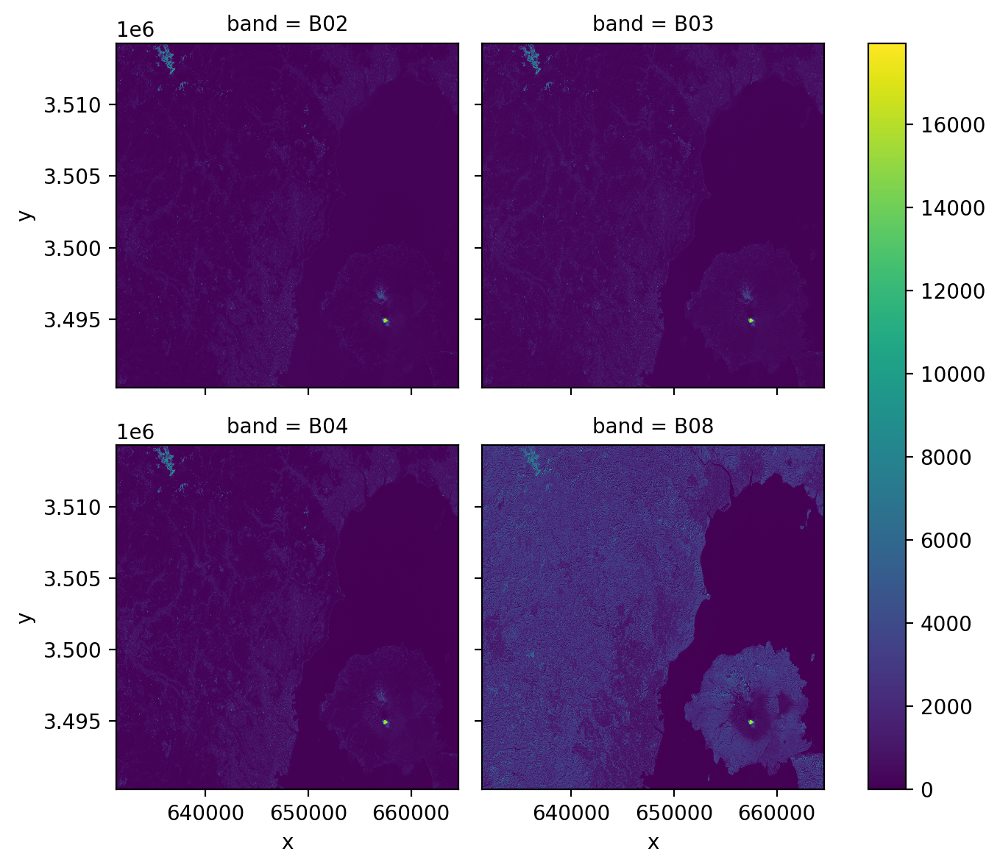

In [12]:
aoi_data.plot.imshow(col='band', col_wrap=2)

True Color、CIR (Color Infrared) 画像を [`robust=True` オプション](https://docs.xarray.dev/en/stable/user-guide/plotting.html#robust-plotting)を渡して表示する。

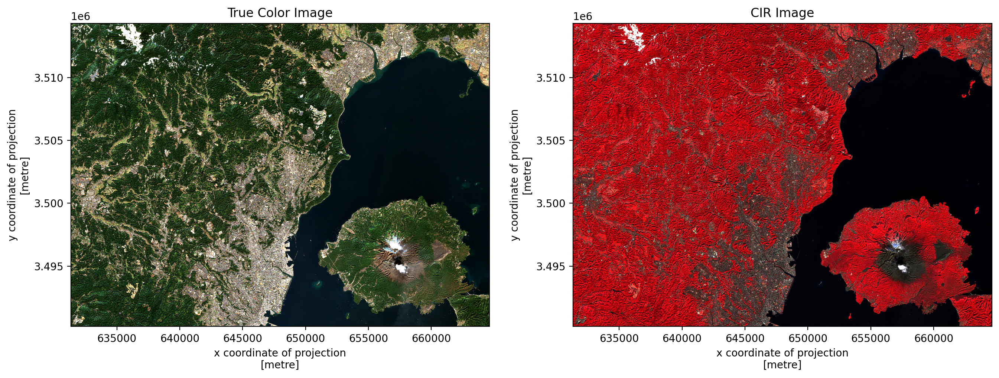

In [13]:
title_to_bands = {
    'True Color Image': ['B04', 'B03', 'B02'],
    'CIR Image': ['B08', 'B04', 'B03']
}
_fig, axs = plt.subplots(1, 2, figsize=(16, 6))
for ax, (title, bands) in zip(axs, title_to_bands.items()):
  aoi_data.sel(band=bands).plot.imshow(ax=ax, rgb='band', robust=True)
  ax.set_aspect('equal')
  ax.set_title(title)

正規化植生指数（NDVI: Normalized Difference Vegetation Index）を計算し、画像表示する。

Text(0.5, 1.0, 'NDVI')

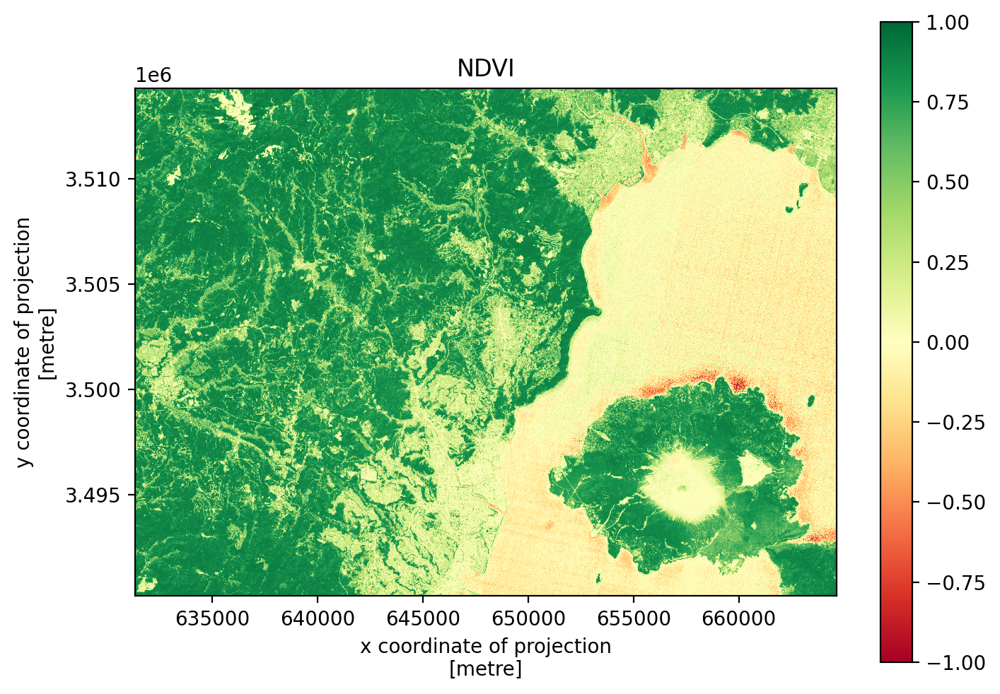

In [14]:
nir = aoi_data.sel(band='B08').astype('float64')
red = aoi_data.sel(band='B04').astype('float64')
ndvi = (nir - red) / (nir + red)

_fig, ax = plt.subplots()
ndvi.plot(ax=ax, cmap='RdYlGn')
ax.set_aspect('equal')
ax.set_title('NDVI')

改良正規化水指数（MNDWI: Modified Normal Difference Water Index） を計算し、画像表示する。

In [15]:
from rasterio.enums import Resampling

swir = rioxarray.open_rasterio(item.assets['B11'].href)
swir = swir.rio.clip_box(*aoi_gdf.total_bounds, crs=aoi_gdf.crs)
swir = swir.rio.reproject_match(aoi_data, resampling=Resampling.average)
swir

<xarray.DataArray (band: 1, y: 2411, x: 3329)>
array([[[ 730,  730,  980, ..., 1313, 1313, 1423],
        [ 905,  905, 1065, ..., 1522, 1522, 1956],
        [ 905,  905, 1065, ..., 1522, 1522, 1956],
        ...,
        [1130, 1130,  841, ..., 1425, 1425, 1132],
        [ 840,  840,  611, ...,  859,  859, 1186],
        [ 840,  840,  611, ...,  859,  859, 1186]]], dtype=uint16)
Coordinates:
  * x            (x) float64 6.313e+05 6.314e+05 ... 6.646e+05 6.646e+05
  * y            (y) float64 3.514e+06 3.514e+06 3.514e+06 ... 3.49e+06 3.49e+06
  * band         (band) int64 1
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:       Area
    OVR_RESAMPLING_ALG:  AVERAGE
    scale_factor:        1.0
    add_offset:          0.0
    _FillValue:          0

Text(0.5, 1.0, 'MNDWI')

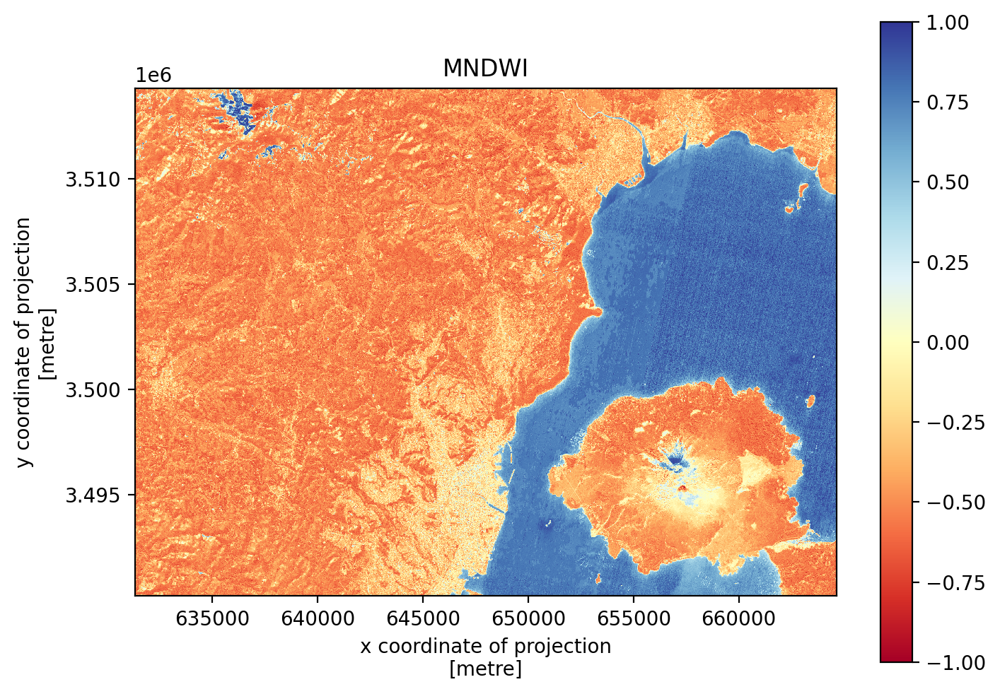

In [16]:
green = aoi_data.sel(band='B03').astype('float64')
mndwi = (green - swir) / (green + swir)

_fig, ax = plt.subplots()
mndwi.plot(ax=ax, cmap='RdYlBu')
ax.set_aspect('equal')
ax.set_title('MNDWI')